# StatFin25 Workshop

## Financial Statistics using Julia

### 16-17th Dec, 2025

#### Instructor: Sourish

## Geometric Brownian Motion (GBM)

- The evolution of stock prices over a time period $[0, T]$, from initial value $P_0$ to final value $P_T$.
- The model is probabilistic: it treats $P_T$ as a random variable.
- For a risk–free asset, the price grows at the risk–free rate:

$$
P_T = P_0 e^{rT}.
$$

- Consider the stochastic model:

$$
P_T = P_0 e^{\mu T + \lambda_T Z_1},
$$

where $Z_1 \sim N(0,1)$, and $\mu$ and $\lambda_T$ are trend and volatility parameters.

- $\mu$ is the drift (trend) parameter, while the term $\lambda_T Z_1$ introduces randomness.
- If $Z \sim N(0,1)$, then

$$
E(e^{cZ}) = e^{c^2/2}.
$$

Thus the random term increases expected return:

$$
E(e^{\lambda_T Z_1}) = e^{\lambda_T^2 / 2} > 1.
$$

---

### Adding the Ito Correction

To offset this upward bias, add a damping term:

$$
P_T = P_0 e^{\mu T} e^{\lambda_T Z_1 - \lambda_T^2 / 2}.
$$

This correction term $-\lambda_T^2/2$ arises from the **Ito formula**.

---

### Combining Returns Over Multiple Periods

Suppose $Z_1$ is the random movement over $[0, T]$ and $Z_2$ is the movement over $[T, 2T]$.
Then the spot price at time $2T$ is:

$$
P_{2T} = P_T e^{\mu T + \lambda_T Z_2 - \lambda_T^2/2}.
$$

Substituting $P_T$:

$$
P_{2T} = P_0 e^{\mu (2T) + \lambda_T (Z_1 + Z_2) - \lambda_T^2}.
$$

Since returns over non–overlapping intervals are independent:

$$
Z_1 + Z_2 \sim N(0,2).
$$

Thus:

$$
P_{2T}
= P_0 e^{\mu (2T) + \lambda_T \sqrt{2}\, Z - \lambda_T^2},
$$

where $Z \sim N(0,1)$.

If we instead treat $[0, 2T]$ as a single interval:

$$
P_{2T}
= P_0 e^{\mu (2T) + \lambda_{2T} Z - \lambda_{2T}^2/2}.
$$

Matching both expressions requires:

$$
\lambda_{2T} = \sqrt{2}\, \lambda_T.
$$

This is satisfied by choosing:

$$
\lambda_T^2 = \sigma^2 T,
$$

where $\sigma > 0$ is the volatility.

---

### Final GBM Model

Combining everything, the final model for the stock price is:

$$
P_T = P_0 \exp\!\left( (\mu - \tfrac{1}{2}\sigma^2)T + \sigma W_T \right),
$$

where $W_T \sim N(0,T)$ is a Wiener process increment.

---

## If returns follow GBM

- Let $P_i$ ($i = 0, 1, \ldots, n$) be spot prices observed over consecutive time intervals of length $\Delta t$.

- Then the log–return is

$$
r_i = \log(P_{i+1}) - \log(P_i).
$$

- According to Geometric Brownian Motion,

$$
r_i = (\mu - \tfrac{1}{2}\sigma^2)\Delta t + \sigma W_{\Delta t},
$$

where $W_{\Delta t} \sim N(0, \Delta t)$.

---

### Distribution of Returns

Therefore,

$$
r_i \sim N\!\left((\mu - \tfrac{1}{2}\sigma^2)\Delta t \;, \; \sigma\sqrt{\Delta t}\right).
$$

Let

$$
\bar{r} = \frac{1}{n} \sum_{i=1}^n r_i
$$

be the sample mean, and sample variance

$$
s^2 = \frac{1}{n-1} \sum_{i=1}^n (r_i - \bar{r})^2.
$$

---

### Estimating Parameters

From the GBM return model we have:

$$
(\mu - \tfrac{1}{2}\sigma^2)\Delta t \approx \bar{r},
\qquad
\sigma^2 \Delta t \approx s^2.
$$

Solving these for $\mu$ and $\sigma$ gives the estimators:

$$
\tilde{\mu} \approx \frac{\bar{r} + s^2/2}{\Delta t},
\qquad
\tilde{\sigma} \approx \frac{s}{\sqrt{\Delta t}}.
$$

These are the standard maximum-likelihood–type estimators used when assuming returns follow a GBM.


In [10]:
using Random, Distributions, Plots, Statistics, CRRao, DataFrames, TimeSeries, FinancialDerivatives, MIToS
using HypothesisTests, PortfolioAnalytics, StatsBase, StaticTools, YFinance,RDatasets

# --- Define Parameters ---
ticker = "^NSEI"
# Use 'range' keyword for relative time periods like "2y", "5y", "3mo", etc.
download_range = "2y" 

# --- Download Data ---
println("Downloading Nifty 50 data for the last 2 years using 'range' parameter...")

# Call get_prices with the correct keyword argument: range
nifty_data_dict = get_prices(ticker, range = download_range)

# Extract the data columns (the values)
# We can select 'open', 'high', 'low', 'close', 'adjclose', and 'vol'
data_values = hcat(
    nifty_data_dict["open"],
    nifty_data_dict["high"],
    nifty_data_dict["low"],
    nifty_data_dict["close"],
    nifty_data_dict["adjclose"],
    nifty_data_dict["vol"]
)

# Define the column names
colnames = [:Open, :High, :Low, :Close, :AdjClose, :Volume]

# Extract the DateTime index (the row names)
index = nifty_data_dict["timestamp"]

# Construct the TimeArray
nifty_ta = TimeArray(index, data_values, colnames)

# Convert to DataFrame for easier printing/analysis
nifty_df = DataFrame(nifty_ta);
last(nifty_df,5)

Row,timestamp,Open,High,Low,Close,AdjClose,Volume
,DateTime,Float64,Float64,Float64,Float64,Float64,Float64
1,2025-12-08T03:45:00,26159.8,26178.7,25892.2,25960.6,25960.6,320700.0
2,2025-12-09T03:45:00,25867.1,25923.7,25728.0,25839.7,25839.7,276000.0
3,2025-12-10T03:45:00,25864.1,25947.7,25734.6,25758.0,25758.0,207900.0
4,2025-12-11T03:45:00,25771.4,25922.8,25693.2,25898.6,25898.6,206100.0
5,2025-12-12T10:01:09,25971.2,26057.6,25938.4,26046.9,26046.9,0.0


In [11]:
# -----------------------------
# Input data
# -----------------------------
Asset = collect(skipmissing(nifty_df.AdjClose))
n = length(Asset)


496

In [12]:
# -----------------------------
# Log-return
# -----------------------------
rt_raw = diff(log.(Asset))
rt = rt_raw[isfinite.(rt_raw)]       # keep only finite entries



493-element Vector{Float64}:
  0.012175662163725676
  0.01284986492150253
 -0.001772582781107701
  0.0016070828069469911
 -0.014222122733048792
  0.004947534816775345
  0.004429103580374516
  0.004297627887901001
  0.009903547502139176
  0.005707562142214684
 -0.0021741548367497643
  0.0004830551173018449
 -0.0035062758581734244
  ⋮
  0.00039106576200431675
 -0.000480805927020711
 -0.001038560391931398
 -0.005499206353098529
 -0.0017762718275893263
  0.0018358417105446279
  0.005848298407897801
 -0.008663963433111377
 -0.004667959097576002
 -0.003164890577821211
  0.005441754277617505
  0.005713636069080152

In [13]:
rbar = mean(rt)
σ = std(rt)
Δt = 1.0
[rbar, σ, Δt]

3-element Vector{Float64}:
 0.00045098044899101415
 0.008256075153288656
 1.0

In [14]:
# GBM drift estimate
μ = rbar + σ^2 / 2

0.0004850618374593893

In [15]:
# -----------------------------
# Simulation settings
# -----------------------------
sim_size = 500
Random.seed!(321)

TaskLocalRNG()

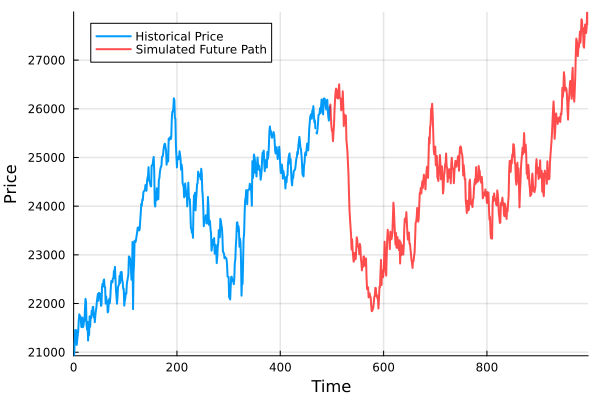

In [16]:
# Simulate future log-returns under GBM
dist = Normal(μ - σ^2/2, σ)
rt_sim = rand(dist, sim_size)

# -----------------------------
# Simulate future asset path
# -----------------------------
Asset_sim = Vector{Float64}(undef, sim_size)
Asset_sim[1] = Asset[end] * exp(rt_sim[1])

for i in 2:sim_size
    Asset_sim[i] = Asset_sim[i-1] * exp(rt_sim[i])
end

# -----------------------------
# Plot historical + simulated
# -----------------------------
yl = minimum(Asset) * 0.85
yu = maximum(Asset) * 1.9

plot(Asset,
     label = "Historical Price",
     xlim = (0, n + sim_size),
     ylim = (yl, yu),
     xlabel = "Time",
     ylabel = "Price",
     lw = 2)

plot!((n+1):(n+sim_size),
      Asset_sim,
      color = :red,
      lw = 2,alpha = 0.7,
      label = "Simulated Future Path")

plot!(grid = :on, gridcolor = :black
    , gridlinewidth = 1.5,alpha = 0.7)


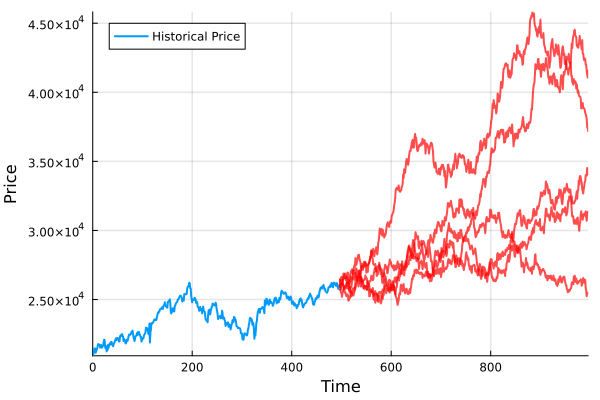

In [17]:
# -----------------------------
# Plot historical + simulations
# -----------------------------
yl = minimum(Asset) * 0.85
yu = maximum(Asset) * 1.9

# base plot
p = plot(
    Asset,
    label = "Historical Price",
    xlim = (0, n + sim_size),
    ylim = (yl, yu),
    xlabel = "Time",
    ylabel = "Price",
    lw = 2,
    grid = :on,
    gridcolor = :black,
    gridlinewidth = 1.5,
)

# Number of path
sim_size = 500
num_paths = 5

# Store all simulations in a matrix: each column = one path
Asset_sims = zeros(sim_size, num_paths)

# Simulate paths
for p in 1:num_paths
    rt_sim = rand(dist, sim_size)  # log-return path
    
    # simulate price path
    Asset_sims[1, p] = Asset[end] * exp(rt_sim[1])
    for i in 2:sim_size
        Asset_sims[i, p] = Asset_sims[i-1, p] * exp(rt_sim[i])
    end
end

# --- Use SAME colour for all simulated paths ---
#sim_color = :lightpink   
sim_color = :red   

for p_idx in 1:num_paths
    plot!(
        p,
        (n+1):(n+sim_size),
        Asset_sims[:, p_idx],
        lw = 2,
        color = sim_color,
        label = "",        # no legend entries for each line
        alpha = 0.7,       # optional: slight transparency
    )
end

display(p)


# **Efficient Frontier**  

## **Portfolio of Two Assets**

### **Portfolio Expected Return**

- $E(R_P)$ is the expected return of the portfolio  
- $\omega_i$ is the weight of asset $i$  
- $E(R_i)$ is the expected return of asset $i$

The portfolio expected return is:

$$
E(R_P) = \omega_1 E(R_1) + \omega_2 E(R_2)
$$


---

### **Portfolio Variance**

- $\sigma_P^2$ is the portfolio variance  
- $\sigma_i^2$ is the variance of asset $i$  
- $\sigma_{1,2}$ is the covariance between asset 1 and asset 2  
- $\omega_1 + \omega_2 = 1$

The variance of a two-asset portfolio is:

$$
\sigma_P^2
= \omega_1^2 \sigma_1^2
+ \omega_2^2 \sigma_2^2
+ 2 \omega_1 \omega_2 \sigma_{1,2}
$$


---

### **Portfolio Standard Deviation (Volatility)**

$$
\sigma_P =
\left(
\omega_1^2 \sigma_1^2
+ \omega_2^2 \sigma_2^2
+ 2 \omega_1 \omega_2 \sigma_{1,2}
\right)^{1/2}
$$

---

#### **Example: Two-Asset Portfolio**

- Two securities, say **X** and **Y**
- Expected returns:  
  $E(R_X) = 5\%, \qquad E(R_Y) = 4\%$

- Variances:  
  $\sigma_X^2 = 9\%, \qquad \sigma_Y^2 = 6\%$

- Covariance:  
  $\sigma_{XY} = 3\%$

---

#### **Portfolio Weights and Resulting Return & Variance**

The table below presents the portfolio return and portfolio variance for six choices of  
weights $ \omega_X $ and $ \omega_Y = 1 - \omega_X $.

| $ \omega_X $ | 100% | 80% | 60% | 40% | 20% | 0% |
|--------------|------|------|------|------|------|------|
| $ \omega_Y $ | 0% | 20% | 40% | 60% | 80% | 100% |
| **Expected Return** $E(R_P)$ | 5% | 4.8% | 4.6% | 4.4% | 4.2% | 4% |
| **Portfolio Variance** $ \sigma_P^2 $ | 9% | 6.96% | 5.64% | 5.04% | 5.16% | 6% |

---

Although we list six discrete choices of $ \omega_X $, in reality **infinitely many weight combinations** are possible for a two-asset portfolio.


## **Portfolio of N Assets**

#### **Expected Portfolio Return**

The expected return of a portfolio of $N$ assets is:

$$E(R_P) = \omega^\top \mu$$

where  
- $\omega^\top = \{\omega_1, \omega_2, \ldots, \omega_N\}$ is the vector of portfolio weights,  
- $\mu = \{\mu_1, \mu_2, \ldots, \mu_N\}$ is the vector of expected returns,  
- $\mu_i = E(R_i)$ for $i = 1, 2, \ldots, N$.


---

#### **Portfolio Volatility**

The portfolio volatility (standard deviation) is:

$$\sigma_P = \sqrt{\omega^\top \Sigma \, \omega}$$

where the covariance matrix is

$$
\Sigma =
\begin{bmatrix}
\sigma_1^2 & \cdots & \sigma_{1N} \\
\vdots & \ddots & \vdots \\
\sigma_{N1} & \cdots & \sigma_N^2
\end{bmatrix}
$$

and $\sigma_{ij}$ is the covariance between asset $i$ and $j$.


---

#### **Efficient Frontier Simulation**

- Compute **expected return** and **volatility** for all portfolios that can be formed by varying the asset weights.  
- The set of all possible portfolios, plotted in return–volatility space, forms the **efficient frontier shape**.  
- A typical exercise simulates **10,000 random portfolios**, each with randomly drawn weights that sum to 1, and computes their returns and volatilities.  
- One may consider a **global passive portfolio** using ETFs tracking FTSE, DAX, SMI, and CAC using data from the `EuStockMarkets` dataset.



In [24]:
using CSV, DataFrames, Statistics, LinearAlgebra, Random, Plots

# --------------------------------------------------
# Load EuStockMarkets from CSV
# --------------------------------------------------
url = "https://raw.githubusercontent.com/vincentarelbundock/Rdatasets/master/csv/datasets/EuStockMarkets.csv"

df = CSV.read(download(url), DataFrame)

# Inspect columns (optional)
# names(df)  # => [:Row, :DAX, :SMI, :CAC, :FTSE]

# Extract the 4 index columns (DAX, SMI, CAC, FTSE)
Index_Value = Matrix(select(df, [:DAX, :SMI, :CAC, :FTSE]))

# Log-returns (%)
r = diff(log.(Index_Value); dims = 1) .* 100
r = Array(r)
(T_minus1, n_assets) = size(r)

println("Loaded EuStockMarkets: $(size(Index_Value))")
println("Computed returns matrix: $(size(r))")



Loaded EuStockMarkets: (1860, 4)
Computed returns matrix: (1859, 4)


In [25]:
# --------------------------------------------------
# Monte Carlo: random portfolios
# --------------------------------------------------
no_of_portf = 10_000
Random.seed!(1)

σ_vec = zeros(no_of_portf)
μ_vec = zeros(no_of_portf)

for i in 1:no_of_portf
    w = rand(1:1000, n_assets)              # random positive integers
    w = w ./ sum(w)                         # normalise to weights
    rp = r * w                              # portfolio return series
    μ_vec[i] = mean(rp)                     # mean return
    σ_vec[i] = std(rp)                      # volatility
end


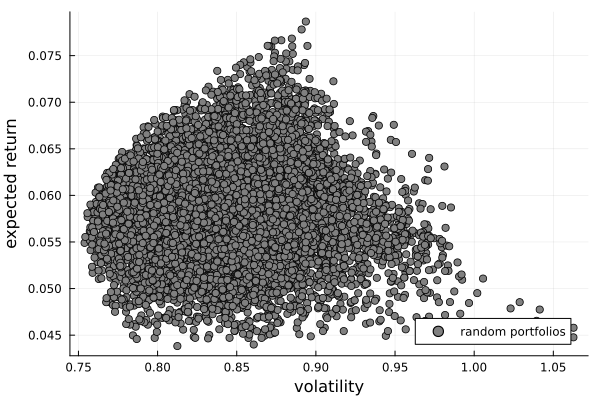

In [26]:
# --------------------------------------------------
# Scatter plot: volatility vs expected return
# --------------------------------------------------
p = scatter(
    σ_vec, μ_vec,
    xlabel = "volatility",
    ylabel = "expected return",
    color  = :grey,
    label  = "random portfolios",
    legend = :bottomright,
)


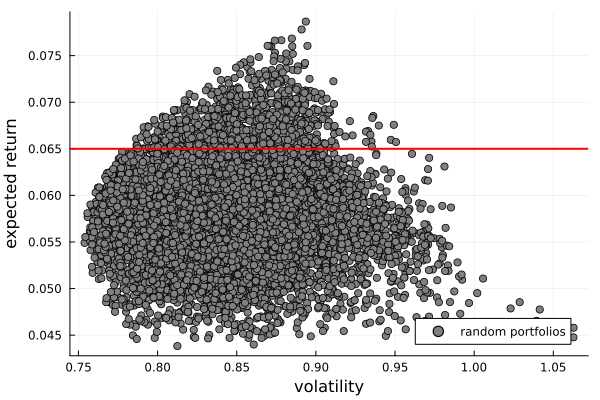

In [27]:
# horizontal line at 0.065 (6.5%)
hline!(p, [0.065], color = :red, lw = 2, label = "")


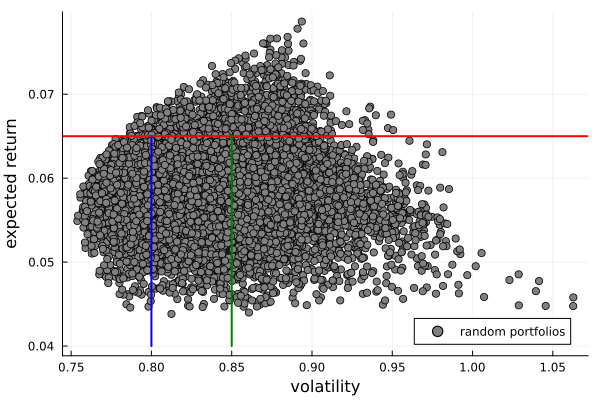

In [28]:
# segments similar to R code
plot!(p, [0.8, 0.8], [0.04, 0.065], color = :blue,  lw = 2, label = "")
plot!(p, [0.85, 0.85], [0.04, 0.065], color = :green, lw = 2, label = "")


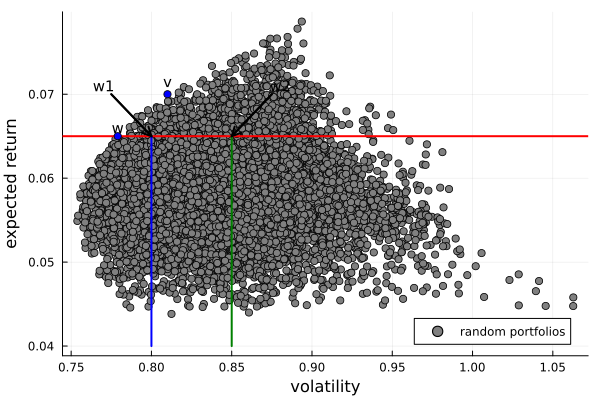

In [29]:
# arrows
plot!(p, [0.775, 0.8], [0.07, 0.065], color = :black, lw = 2, arrow = :arrow, label = "")
plot!(p, [0.875, 0.85], [0.07, 0.065], color = :black, lw = 2, arrow = :arrow, label = "")

# text + points
annotate!(p, 0.77, 0.071, text("w1", 10))
annotate!(p, 0.88, 0.071, text("w2", 10))

scatter!(p, [0.779], [0.065], color = :blue, label = "")
annotate!(p, 0.779, 0.066, text("w", 10))

scatter!(p, [0.81], [0.07], color = :blue, label = "")
annotate!(p, 0.81, 0.0715, text("v", 10))


In [18]:






# --------------------------------------------------
# Efficient frontier (Markowitz closed form)
# --------------------------------------------------
Σ = cov(r; dims = 1) |> Matrix          # 4×4 covariance matrix
μ_assets = vec(mean(r; dims = 1))       # 4×1 mean returns

Σ_inv   = inv(Σ)
ones_v  = ones(length(μ_assets))

A = dot(μ_assets, Σ_inv * μ_assets)
B = dot(μ_assets, Σ_inv * ones_v)
C = dot(ones_v,  Σ_inv * ones_v)
D = A * C - B^2

er = collect(0.045:0.001:0.075)         # target expected returns
frontier = Matrix{Float64}(undef, length(er), 2)   # [σ, μ]

for (i, m) in enumerate(er)
    σ2 = (C * m^2 - 2B * m + A) / D     # closed-form Markowitz variance
    frontier[i, 1] = sqrt(σ2)          # σ
    frontier[i, 2] = m                 # μ
end

plot!(p,
      frontier[:, 1], frontier[:, 2],
      color = :red,
      lw = 2,
      label = "efficient frontier")

display(p)


LoadError: Unable to locate dataset file /Users/sourishdas/.julia/packages/RDatasets/fNG6F/src/../data/datasets/EuStockMarkets.rda or /Users/sourishdas/.julia/packages/RDatasets/fNG6F/src/../data/datasets/EuStockMarkets.csv.gz